## Importing Libraries

In [1]:
##importing Libraries for data manipulation
import pandas as pd #dataframe
import numpy as np #numerical python
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #plotting
import plotly.express as px #plotting


# Warnings library will be used to ignore some warnings
import warnings #warning
warnings.filterwarnings('ignore')

## Loading the DATA

In [2]:
loan_data = pd.read_csv('loan.csv')


In [3]:
# Printing the data(first 5 rows)
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
# Basic infomation about the dataframe
print(loan_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB
None


In [5]:
# Data types of each column
print(loan_data.dtypes)

id                              int64
member_id                       int64
loan_amnt                       int64
funded_amnt                     int64
funded_amnt_inv               float64
                               ...   
tax_liens                     float64
tot_hi_cred_lim               float64
total_bal_ex_mort             float64
total_bc_limit                float64
total_il_high_credit_limit    float64
Length: 111, dtype: object


In [6]:
# Describing the dataframe
print(loan_data.describe())

                 id     member_id     loan_amnt   funded_amnt  \
count  3.971700e+04  3.971700e+04  39717.000000  39717.000000   
mean   6.831319e+05  8.504636e+05  11219.443815  10947.713196   
std    2.106941e+05  2.656783e+05   7456.670694   7187.238670   
min    5.473400e+04  7.069900e+04    500.000000    500.000000   
25%    5.162210e+05  6.667800e+05   5500.000000   5400.000000   
50%    6.656650e+05  8.508120e+05  10000.000000   9600.000000   
75%    8.377550e+05  1.047339e+06  15000.000000  15000.000000   
max    1.077501e+06  1.314167e+06  35000.000000  35000.000000   

       funded_amnt_inv   installment    annual_inc           dti  \
count     39717.000000  39717.000000  3.971700e+04  39717.000000   
mean      10397.448868    324.561922  6.896893e+04     13.315130   
std        7128.450439    208.874874  6.379377e+04      6.678594   
min           0.000000     15.690000  4.000000e+03      0.000000   
25%        5000.000000    167.020000  4.040400e+04      8.170000   
50%   

In [7]:
# Columns in the dataframe
print(loan_data.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)


## Basic information about the data

In [8]:
## Number of rows and columns
print('Number of Columns:',loan_data.shape[1])
print('Number of Rows:',loan_data.shape[0])

## Number of missing values
print('Number of missing values:',loan_data.isnull().sum().sum())

## Number of unique values
print('Number of unique values:',loan_data.nunique().sum())

## Number of duplicates
print('Number of duplicates:',loan_data.duplicated().sum())

Number of Columns: 111
Number of Rows: 39717
Number of missing values: 2263366
Number of unique values: 416800
Number of duplicates: 0


## Analysing data set for cleaning 

In [9]:
# checking null values in data set
print(loan_data.isnull().sum())

id                                0
member_id                         0
loan_amnt                         0
funded_amnt                       0
funded_amnt_inv                   0
                              ...  
tax_liens                        39
tot_hi_cred_lim               39717
total_bal_ex_mort             39717
total_bc_limit                39717
total_il_high_credit_limit    39717
Length: 111, dtype: int64


In [10]:
# Checking null values percetange in descending order in given data set.
print((loan_data.isnull().sum()/loan_data.shape[0]*100).round(2).sort_values(ascending=False))

verification_status_joint    100.0
annual_inc_joint             100.0
mo_sin_old_rev_tl_op         100.0
mo_sin_old_il_acct           100.0
bc_util                      100.0
                             ...  
delinq_amnt                    0.0
policy_code                    0.0
earliest_cr_line               0.0
delinq_2yrs                    0.0
id                             0.0
Length: 111, dtype: float64


In [11]:
# Removed all columns whose null values percentage is above 50%, as these columns will not impact on analysis
loan_data = loan_data.loc[:,loan_data.isnull().sum()/loan_data.shape[0]*100 <50]
# Shape of the dataframe after removing columns
print(loan_data.shape)

(39717, 54)


In [12]:
# Checking columns again for null value percentage
print((loan_data.isnull().sum()/loan_data.shape[0]*100).round(2).sort_values(ascending=False))

desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
total_rec_prncp                0.00
out_prncp                      0.00
initial_list_status            0.00
out_prncp_inv                  0.00
total_acc                      0.00
total_pymnt                    0.00
total_pymnt_inv                0.00
collection_recovery_fee        0.00
total_rec_int                  0.00
total_rec_late_fee             0.00
recoveries                     0.00
pub_rec                        0.00
last_pymnt_amnt                0.00
policy_code                    0.00
application_type               0.00
acc_now_delinq                 0.00
delinq_amnt                 

In [13]:
# Columns in the dataframe
print(loan_data.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')


## Removing the irrelevant columns

In [14]:
# Removing irrelevant columns which are calculated after loan is approved thus have no relevance to the analysis
loan_data=loan_data.drop(['revol_bal','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt','last_credit_pull_d','desc','url','zip_code','member_id','funded_amnt_inv','emp_title','funded_amnt'],axis=1)


In [15]:
# Checking columns for irrelevant data which has no impact to analysis(having very few unqiue values)
print(loan_data.nunique().sort_values(ascending=True))

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
initial_list_status               1
collections_12_mths_ex_med        1
pymnt_plan                        1
application_type                  1
policy_code                       1
term                              2
pub_rec_bankruptcies              3
loan_status                       3
verification_status               3
home_ownership                    5
pub_rec                           5
grade                             7
inq_last_6mths                    9
emp_length                       11
delinq_2yrs                      11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
int_rate                        371
earliest_cr_line                526
loan_amnt                   

## As We have many columns with single unique value and these are not relevant to the analysis ,removed single unique value colmuns.

In [16]:
# Removing irrelevant columns which contain 1 unique value
loan_data = loan_data.loc[:,loan_data.nunique()>1]

# Shape of the dataframe after removing columns
print(loan_data.shape)

(39717, 25)


In [17]:
# Columns in the dataframe
print(loan_data.columns)

Index(['id', 'loan_amnt', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'title',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_util', 'total_acc',
       'pub_rec_bankruptcies'],
      dtype='object')


In [18]:
# Checking for missing values across the dataframe
print(loan_data.isnull().sum().sort_values(ascending=False))

emp_length              1075
pub_rec_bankruptcies     697
revol_util                50
title                     11
purpose                    0
total_acc                  0
pub_rec                    0
open_acc                   0
inq_last_6mths             0
earliest_cr_line           0
delinq_2yrs                0
dti                        0
addr_state                 0
id                         0
loan_amnt                  0
issue_d                    0
verification_status        0
annual_inc                 0
home_ownership             0
sub_grade                  0
grade                      0
installment                0
int_rate                   0
term                       0
loan_status                0
dtype: int64


### Handling Missing Values

In [19]:
##  Fill null with Unknown to emp_length 
loan_data["emp_length"].fillna("Unknown", inplace=True)

In [20]:
# Check emp_length count
loan_data.emp_length.value_counts()

emp_length
10+ years    8879
< 1 year     4583
2 years      4388
3 years      4095
4 years      3436
5 years      3282
1 year       3240
6 years      2229
7 years      1773
8 years      1479
9 years      1258
Unknown      1075
Name: count, dtype: int64

In [21]:
##  Fill null with Unknown to pub_rec_bankruptcies 
loan_data["pub_rec_bankruptcies"].fillna("Unknown", inplace=True)
loan_data.pub_rec_bankruptcies.value_counts()

pub_rec_bankruptcies
0.0        37339
1.0         1674
Unknown      697
2.0            7
Name: count, dtype: int64

In [22]:
# Checking "revol_util" after removing null values, so we can handle missing values in original data
loan_data.revol_util=loan_data.revol_util.apply(lambda x:str(x).replace('%','')).astype('float').round(2)

print(loan_data['revol_util'].describe())
print(loan_data['revol_util'].median())

count    39667.000000
mean        48.832152
std         28.332634
min          0.000000
25%         25.400000
50%         49.300000
75%         72.400000
max         99.900000
Name: revol_util, dtype: float64
49.3


In [23]:
# Variation between mean and median is very close to each, so filling null values with the mean value.
loan_data['revol_util'].fillna("48.83%")

0        83.7
1         9.4
2        98.5
3        21.0
4        53.9
         ... 
39712    13.1
39713    26.9
39714    19.4
39715     0.7
39716    51.5
Name: revol_util, Length: 39717, dtype: object

In [24]:
### converting data type to few columns.
loan_data.int_rate=loan_data.int_rate.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
loan_data.revol_util=loan_data.revol_util.apply(lambda x:str(x).replace('%','')).astype('float').round(2)
loan_data['annual_inc'] = loan_data['annual_inc'].apply(lambda x: f"{x:.0f}").astype(int)
loan_data.term=loan_data.term.apply(lambda x: int(x.replace(' months',''))).astype(int)

In [25]:
loan_data.head(5)

,id,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,...,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
0,1077501,5000,36,10.65,162.87,B,B2,10+ years,RENT,24000,...,AZ,27.65,0,Jan-85,1,3,0,83.7,9,0.0
1,1077430,2500,60,15.27,59.83,C,C4,< 1 year,RENT,30000,...,GA,1.00,0,Apr-99,5,3,0,9.4,4,0.0
2,1077175,2400,36,15.96,84.33,C,C5,10+ years,RENT,12252,...,IL,8.72,0,Nov-01,2,2,0,98.5,10,0.0
3,1076863,10000,36,13.49,339.31,C,C1,10+ years,RENT,49200,...,CA,20.00,0,Feb-96,1,10,0,21.0,37,0.0
4,1075358,3000,60,12.69,67.79,B,B5,1 year,RENT,80000,...,OR,17.94,0,Jan-96,0,15,0,53.9,38,0.0


## Data Insights

## Univariate Numerical Data Analysis 

###  Univariate analysis on "loan_amnt" 

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


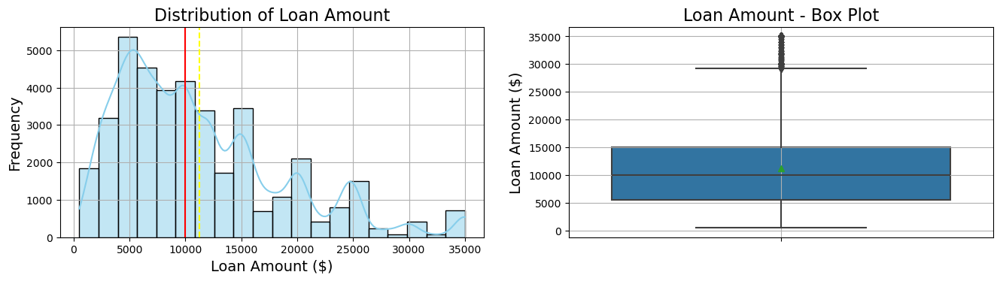

In [26]:

print(loan_data['loan_amnt'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)


ax = sns.histplot(data=loan_data, x='loan_amnt', bins=20, kde=True, color='skyblue')
ax.set_title('Distribution of Loan Amount', fontsize=16)
ax.set_xlabel('Loan Amount ($)', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.axvline(np.mean(loan_data['loan_amnt']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['loan_amnt']), color='red', linestyle='-') # Add median to the histogra
ax.grid(True)

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['loan_amnt'],showmeans=True)
ax.set_title('Loan Amount - Box Plot',fontsize=16)
ax.set_ylabel('Loan Amount ($)',fontsize=14)
ax.grid(True)

plt.savefig("loan_amt.png", transparent=True)

plt.show()

### Observation:

#### Most of the borrowers taken loan amounts between 5500 - 15000 
#### 99-95 percentile of loan amounts are below 30000 

count    39717.000000
mean        42.418007
std         10.622815
min         36.000000
25%         36.000000
50%         36.000000
75%         60.000000
max         60.000000
Name: term, dtype: float64


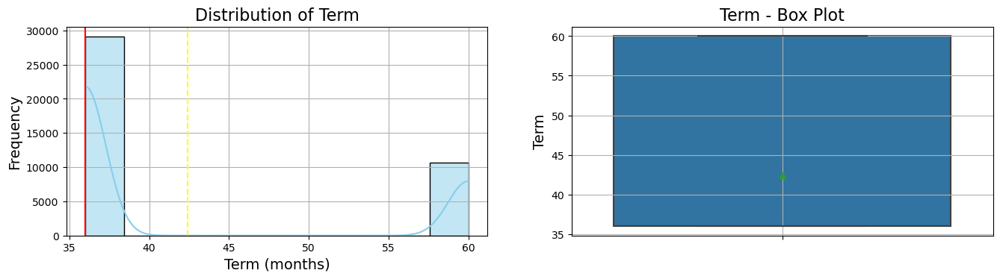

In [27]:
#  Univariate analysis on "term"
print(loan_data['term'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)


ax = sns.histplot(data=loan_data, x='term', bins=10, kde=True, color='skyblue')
ax.set_title('Distribution of Term', fontsize=16)
ax.set_xlabel('Term (months)', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.axvline(np.mean(loan_data['term']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['term']), color='red', linestyle='-') # Add median to the histogra
ax.grid(True)

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['term'],showmeans=True)
ax.set_title('Term - Box Plot',fontsize=16)
ax.set_ylabel('Term',fontsize=14)
ax.grid(True)

plt.savefig("term.png", transparent=True)

plt.show()

### Observation :
### 36 months term borrowers are more 

count    39717.000000
mean        12.021177
std          3.724825
min          5.420000
25%          9.250000
50%         11.860000
75%         14.590000
max         24.590000
Name: int_rate, dtype: float64


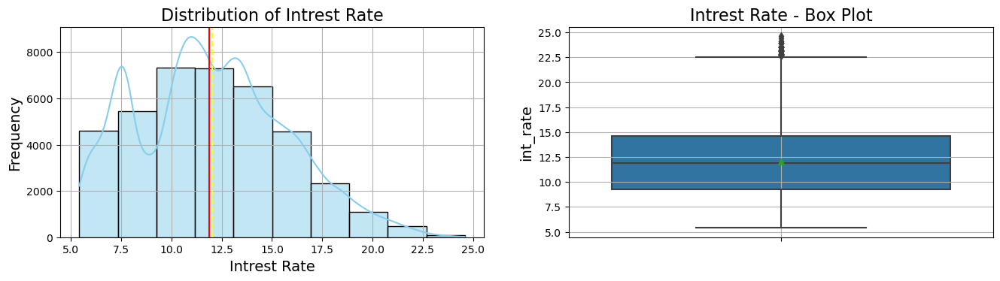

In [28]:
# Univariate analysis on "int_rate"
print(loan_data['int_rate'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)


ax = sns.histplot(data=loan_data, x='int_rate', bins=10, kde=True, color='skyblue')
ax.set_title('Distribution of Intrest Rate', fontsize=16)
ax.set_xlabel('Intrest Rate', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.axvline(np.mean(loan_data['int_rate']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['int_rate']), color='red', linestyle='-') # Add median to the histogra
ax.grid(True)

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['int_rate'],showmeans=True)
ax.set_title('Intrest Rate - Box Plot',fontsize=16)
ax.set_ylabel('int_rate',fontsize=14)
ax.grid(True)

plt.savefig("int_rate.png", transparent=True)

plt.show()

### Observations:
### As intrest rate increases from 14% number of borrowers are less.
### Majority of the borrowers intrest rate is between 9.25 to 14.59 

count    39717.000000
mean       324.561922
std        208.874874
min         15.690000
25%        167.020000
50%        280.220000
75%        430.780000
max       1305.190000
Name: installment, dtype: float64


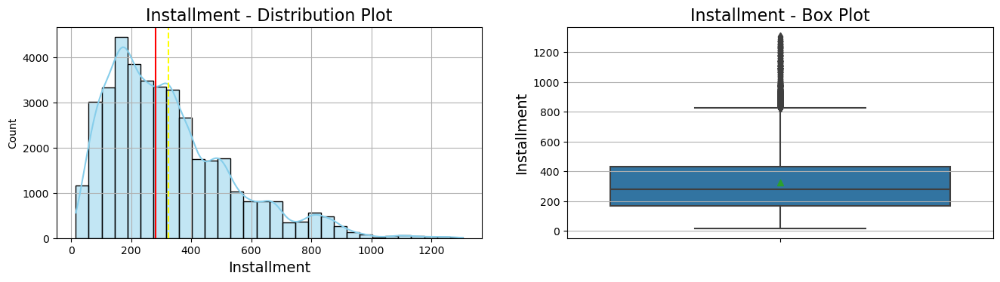

In [29]:
# Univariate analysis on "installment"
print(loan_data['installment'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='installment', kde = True, bins=30, color='skyblue')
ax.set_title('Installment - Distribution Plot',fontsize=16)
ax.set_xlabel('Installment',fontsize=14)
ax.axvline(np.mean(loan_data['installment']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['installment']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['installment'] ,showmeans=True)
ax.set_title('Installment - Box Plot',fontsize=16)
ax.set_ylabel('Installment',fontsize=14)
ax.grid(axis='y')
plt.savefig("installment.png", transparent=True)
plt.show()

### Observations :
### Most of the instalments are in betwen 167 to 430  
### lowest installment is 15 and highest installment is 1305
### high installment borrowers are few and low installment borrowers are high 

count    3.971700e+04
mean     6.896893e+04
std      6.379377e+04
min      4.000000e+03
25%      4.040400e+04
50%      5.900000e+04
75%      8.230000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64


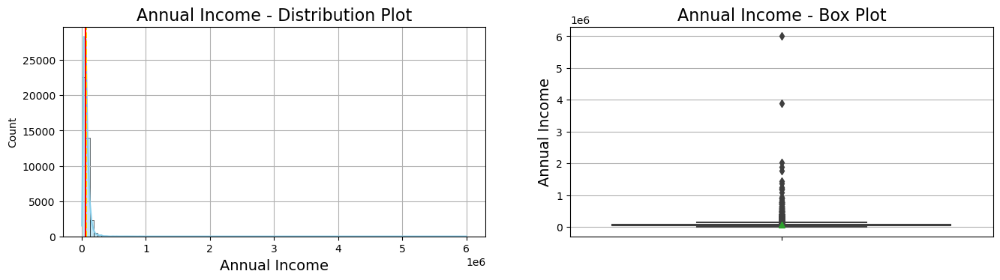

In [30]:
# Univariate analysis on "annual_inc"
print(loan_data['annual_inc'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='annual_inc', kde = True, bins=100, color='skyblue')
ax.set_title('Annual Income - Distribution Plot',fontsize=16)
ax.set_xlabel('Annual Income',fontsize=14)
ax.axvline(np.mean(loan_data['annual_inc']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['annual_inc']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['annual_inc'] ,showmeans=True)
ax.set_title('Annual Income - Box Plot',fontsize=16)
ax.set_ylabel('Annual Income',fontsize=14)
ax.grid(axis='y')
plt.savefig("annual_inc.png", transparent=True)

plt.show()



In [31]:
### As observed from the box plot annual_inc shows an exponential increase around the 99th percentile. Remove above the 99th percentile values.
loan_data = loan_data[loan_data.annual_inc<=np.percentile(loan_data.annual_inc,99)]

count     39319.000000
mean      65524.215697
std       35215.885257
min        4000.000000
25%       40000.000000
50%       58000.000000
75%       81000.000000
max      234996.000000
Name: annual_inc, dtype: float64


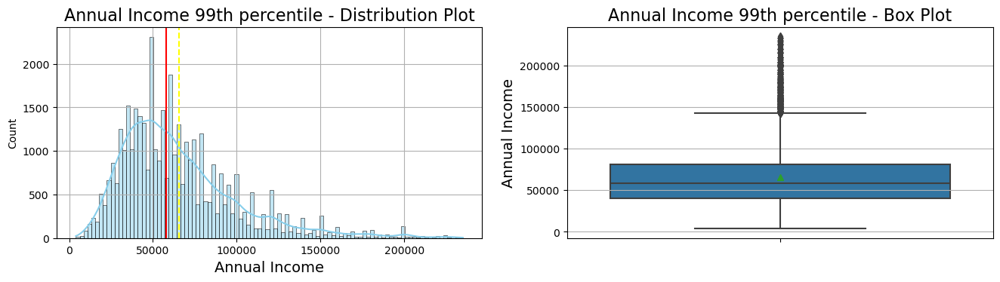

In [32]:
# Univariate analysis on "annual_inc" after treating outliers
print(loan_data['annual_inc'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='annual_inc', kde = True, bins=100, color='skyblue')
ax.set_title('Annual Income 99th percentile - Distribution Plot',fontsize=16)
ax.set_xlabel('Annual Income',fontsize=14)
ax.axvline(np.mean(loan_data['annual_inc']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['annual_inc']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['annual_inc'] ,showmeans=True)
ax.set_title('Annual Income 99th percentile - Box Plot',fontsize=16)
ax.set_ylabel('Annual Income',fontsize=14)
ax.grid(axis='y')
plt.savefig("annual_inc.png", transparent=True)

plt.show()


### 50000 thousand annnual income  borrowers  are more with compare to other income borrowers.
### Most of the borrowers income is in between 4000 to 81000


count    39319.000000
mean        13.376622
std          6.663140
min          0.000000
25%          8.270000
50%         13.480000
75%         18.640000
max         29.990000
Name: dti, dtype: float64


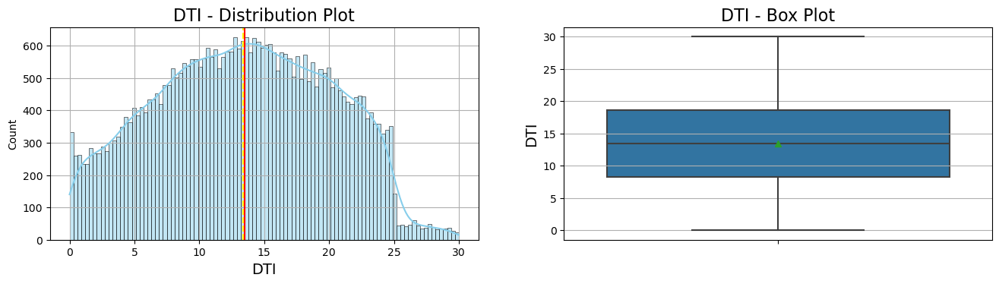

In [33]:
# Univariate analysis on "dti"
print(loan_data['dti'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='dti', kde = True, bins=100, color='skyblue')
ax.set_title('DTI - Distribution Plot',fontsize=16)
ax.set_xlabel('DTI',fontsize=14)
ax.axvline(np.mean(loan_data['dti']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['dti']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['dti'] ,showmeans=True)
ax.set_title('DTI - Box Plot',fontsize=16)
ax.set_ylabel('DTI',fontsize=14)
ax.grid(axis='y')
plt.savefig("dti.png", transparent=True)

plt.show()

### Observations :
### Average debt to income ratio is 13.37
### Most of the borrowers debt to income ration is in between 8.27 to 18.64

count    39319.000000
mean         0.145502
std          0.490268
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         11.000000
Name: delinq_2yrs, dtype: float64


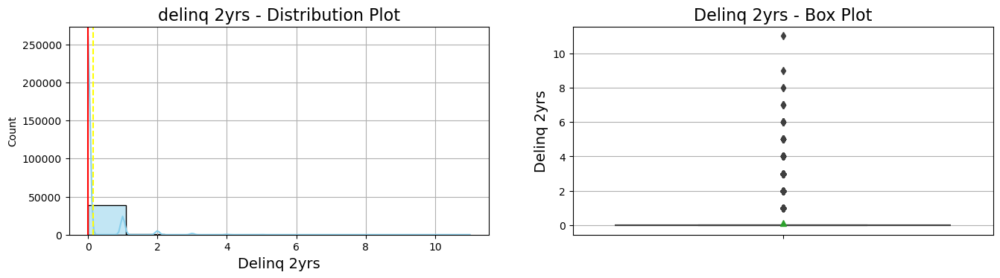

In [34]:
# Univariate analysis on "delinq_2yrs"
print(loan_data['delinq_2yrs'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='delinq_2yrs', kde = True, bins=10, color='skyblue')
ax.set_title('delinq 2yrs - Distribution Plot',fontsize=16)
ax.set_xlabel('Delinq 2yrs',fontsize=14)
ax.axvline(np.mean(loan_data['delinq_2yrs']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['delinq_2yrs']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['delinq_2yrs'] ,showmeans=True)
ax.set_title('Delinq 2yrs - Box Plot',fontsize=16)
ax.set_ylabel('Delinq 2yrs',fontsize=14)
ax.grid(axis='y')
plt.savefig("delinq_2yrs.png", transparent=True)

plt.show()

count    39319.000000
mean         0.866757
std          1.067856
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          8.000000
Name: inq_last_6mths, dtype: float64


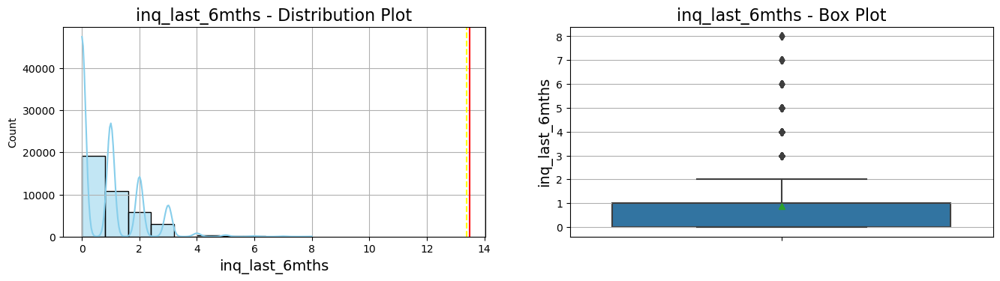

In [35]:
# Univariate analysis on "inq_last_6mths"
print(loan_data['inq_last_6mths'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='inq_last_6mths', kde = True, bins=10, color='skyblue')
ax.set_title('inq_last_6mths - Distribution Plot',fontsize=16)
ax.set_xlabel('inq_last_6mths',fontsize=14)
ax.axvline(np.mean(loan_data['dti']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['dti']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['inq_last_6mths'] ,showmeans=True)
ax.set_title('inq_last_6mths - Box Plot',fontsize=16)
ax.set_ylabel('inq_last_6mths',fontsize=14)
ax.grid(axis='y')
plt.savefig("inq_last_6mths.png", transparent=True)

plt.show()

count    39319.000000
mean         9.275948
std          4.391065
min          2.000000
25%          6.000000
50%          9.000000
75%         12.000000
max         44.000000
Name: open_acc, dtype: float64


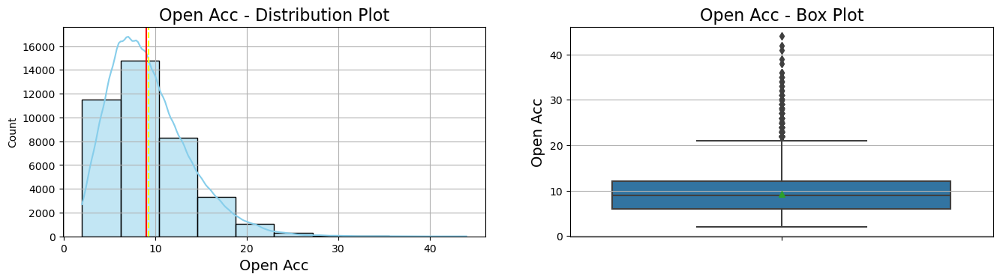

In [36]:
# Univariate analysis on "open_acc"
print(loan_data['open_acc'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='open_acc', kde = True, bins=10, color='skyblue')
ax.set_title('Open Acc - Distribution Plot',fontsize=16)
ax.set_xlabel('Open Acc',fontsize=14)
ax.axvline(np.mean(loan_data['open_acc']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['open_acc']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['open_acc'] ,showmeans=True)
ax.set_title('Open Acc - Box Plot',fontsize=16)
ax.set_ylabel('Open Acc',fontsize=14)
ax.grid(axis='y')
plt.savefig("open_acc.png", transparent=True)

plt.show()

count    39319.000000
mean         0.055368
std          0.237751
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: pub_rec, dtype: float64


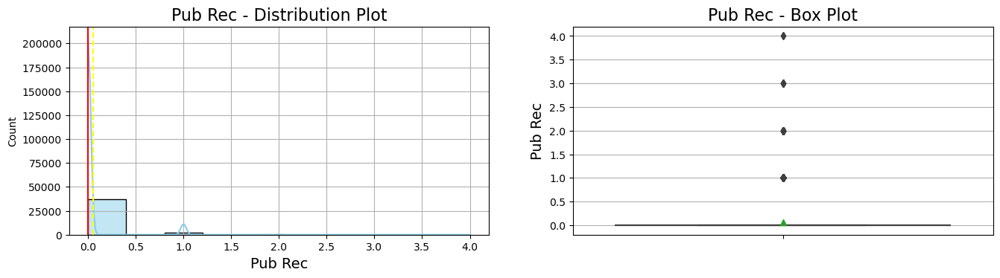

In [37]:
# Univariate analysis on "pub_rec"
print(loan_data['pub_rec'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='pub_rec', kde = True, bins=10, color='skyblue')
ax.set_title('Pub Rec - Distribution Plot',fontsize=16)
ax.set_xlabel('Pub Rec',fontsize=14)
ax.axvline(np.mean(loan_data['pub_rec']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['pub_rec']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['pub_rec'] ,showmeans=True)
ax.set_title('Pub Rec - Box Plot',fontsize=16)
ax.set_ylabel('Pub Rec',fontsize=14)
ax.grid(axis='y')
plt.savefig("pub_rec.png", transparent=True)

plt.show()

count    39270.000000
mean        48.820619
std         28.306851
min          0.000000
25%         25.400000
50%         49.300000
75%         72.300000
max         99.900000
Name: revol_util, dtype: float64


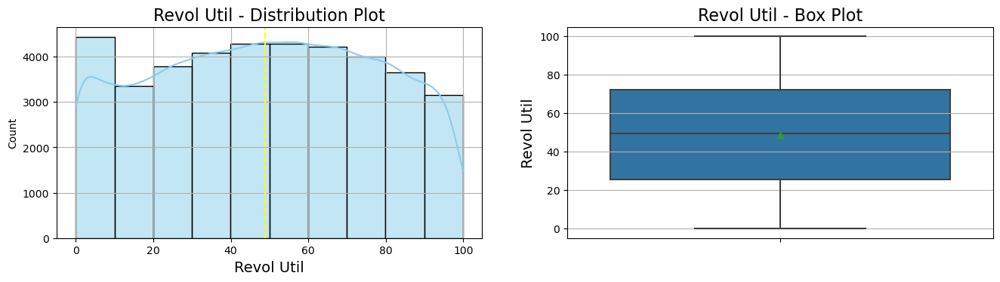

In [38]:
# Univariate analysis on "revol_util"
print(loan_data['revol_util'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='revol_util', kde = True, bins=10, color='skyblue')
ax.set_title('Revol Util - Distribution Plot',fontsize=16)
ax.set_xlabel('Revol Util',fontsize=14)
ax.axvline(np.mean(loan_data['revol_util']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['revol_util']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['revol_util'] ,showmeans=True)
ax.set_title('Revol Util - Box Plot',fontsize=16)
ax.set_ylabel('Revol Util',fontsize=14)
ax.grid(axis='y')
plt.savefig("revol_util.png", transparent=True)

plt.show()

count    39319.000000
mean        22.009893
std         11.360019
min          2.000000
25%         13.000000
50%         20.000000
75%         29.000000
max         90.000000
Name: total_acc, dtype: float64


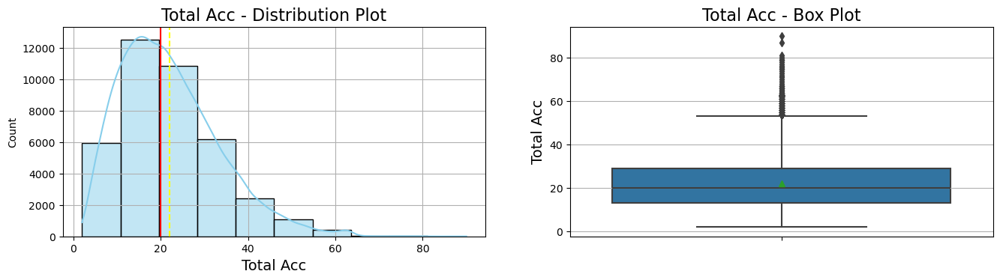

In [39]:
# Univariate analysis on "total_acc"
print(loan_data['total_acc'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='total_acc', kde = True, bins=10, color='skyblue')
ax.set_title('Total Acc - Distribution Plot',fontsize=16)
ax.set_xlabel('Total Acc',fontsize=14)
ax.axvline(np.mean(loan_data['total_acc']), color='yellow', linestyle='--') # Add mean to the histogram
ax.axvline(np.median(loan_data['total_acc']), color='red', linestyle='-') # Add median to the histogra
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['total_acc'] ,showmeans=True)
ax.set_title('Total Acc - Box Plot',fontsize=16)
ax.set_ylabel('Total Acc',fontsize=14)
ax.grid(axis='y')
plt.savefig("total_acc.png", transparent=True)

plt.show()

## Univariate Categorical Data Analysis 


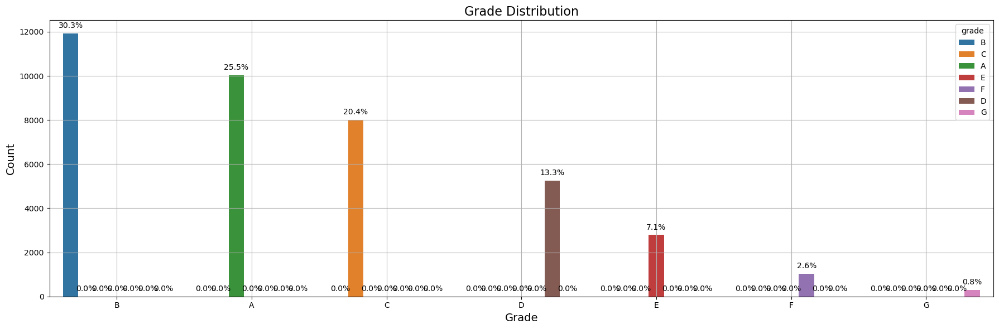

In [40]:
# Univariate Categorical Data Analysis on "grade"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.grade, order=loan_data.grade.value_counts().index, hue=loan_data.grade)
bx1.set_title('Grade Distribution', fontsize=16)
bx1.set_xlabel('Grade', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.grade)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.savefig("grade.png", transparent=True)
plt.show()

Observations: B grade borrowers are more 

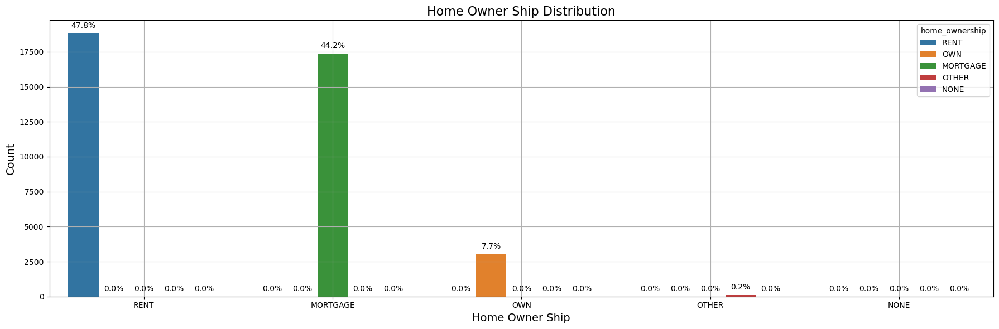

In [41]:
# Univariate Categorical Data Analysis on "home_ownership"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.home_ownership, order=loan_data.home_ownership.value_counts().index, hue=loan_data.home_ownership)
bx1.set_title('Home Owner Ship Distribution', fontsize=16)
bx1.set_xlabel('Home Owner Ship', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.home_ownership)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.savefig("home_ownership.png", transparent=True)
plt.show()

In [42]:
### Observations: Rent borrowers are more

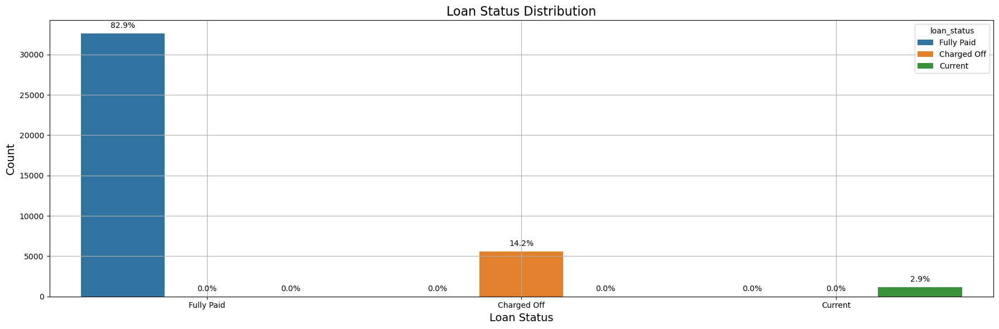

In [43]:
# Univariate Categorical Data Analysis on "loan_status"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.loan_status, order=loan_data.loan_status.value_counts().index, hue=loan_data.loan_status)
bx1.set_title('Loan Status Distribution', fontsize=16)
bx1.set_xlabel('Loan Status', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.loan_status)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.savefig("loan_status.png", transparent=True)
plt.show()

In [44]:
### Observations : 14.2% borrowers are defaulters

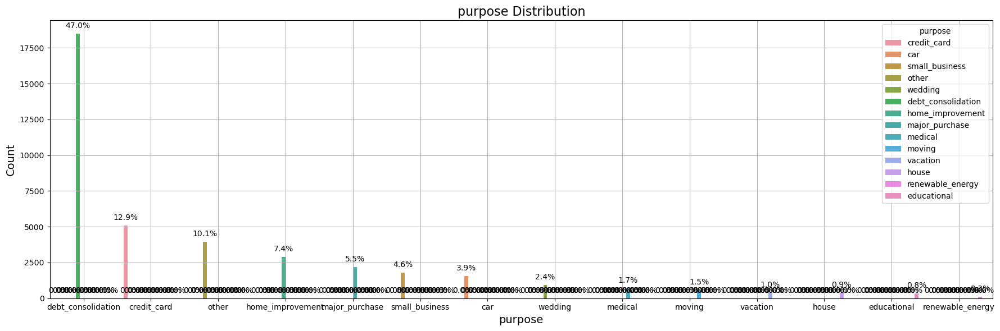

In [45]:
# Univariate Categorical Data Analysis on "purpose"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.purpose, order=loan_data.purpose.value_counts().index, hue=loan_data.purpose)
bx1.set_title('purpose Distribution', fontsize=16)
bx1.set_xlabel('purpose', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.purpose)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.savefig("purpose.png", transparent=True)
plt.show()

In [46]:
### 47% borrowers are taken loans for Debt consolidation

In [47]:
### Bivariate Analysis

count    39319.000000
mean     11134.114550
std       7376.086312
min        500.000000
25%       5400.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64


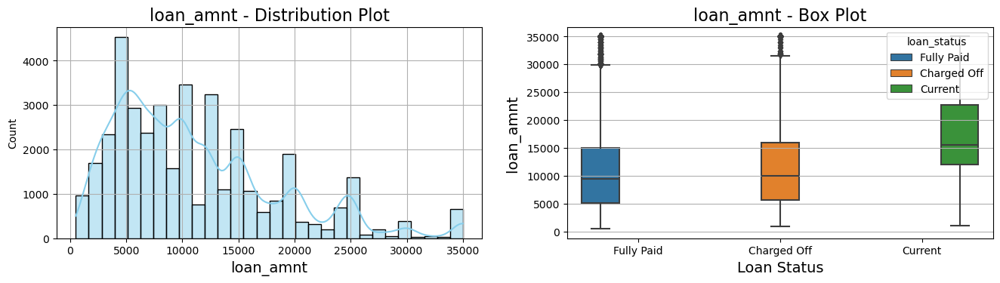

--------------------------------------------------------------------------------------
               count       mean       std   min    25%    50%      75%    max
loan_status                                                                  
Charged Off   5584.0  13.808626  3.648676  5.42  11.28  13.57  16.4000  24.40
Current       1126.0  15.000861  3.598350  6.00  11.99  14.65  17.8875  24.59
Fully Paid   32609.0  11.594074  3.591723  5.42   8.49  11.49  13.9800  24.11


In [48]:
# Bivariate analysis on loan status and "int_rate"
print(loan_data['loan_amnt'].describe())


# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='loan_amnt', kde=True, bins=30, color='skyblue')
ax.set_title('loan_amnt - Distribution Plot',fontsize=16)
ax.set_xlabel('loan_amnt',fontsize=14)
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['loan_amnt'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('loan_amnt - Box Plot',fontsize=16)
ax.set_ylabel('loan_amnt ',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')

plt.show()

print("--------------------------------------------------------------------------------------")
print(loan_data.groupby('loan_status')['int_rate'].describe())

count    39319.000000
mean        42.408505
std         10.617818
min         36.000000
25%         36.000000
50%         36.000000
75%         60.000000
max         60.000000
Name: term, dtype: float64


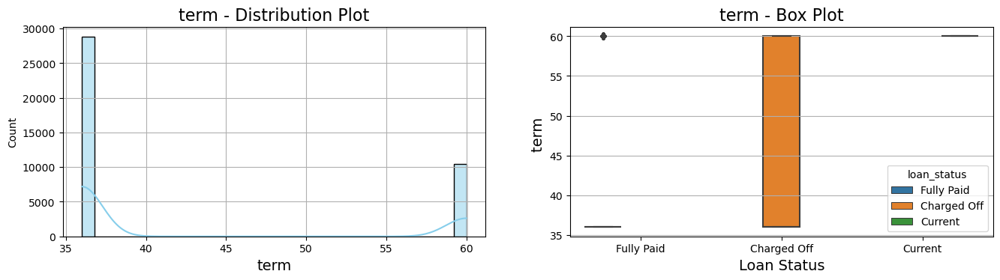

--------------------------------------------------------------------------------------
               count       mean       std   min    25%    50%      75%    max
loan_status                                                                  
Charged Off   5584.0  13.808626  3.648676  5.42  11.28  13.57  16.4000  24.40
Current       1126.0  15.000861  3.598350  6.00  11.99  14.65  17.8875  24.59
Fully Paid   32609.0  11.594074  3.591723  5.42   8.49  11.49  13.9800  24.11


In [49]:
# Bivariate analysis on loan status and "int_rate"
print(loan_data['term'].describe())


# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='term', kde=True, bins=30, color='skyblue')
ax.set_title('term - Distribution Plot',fontsize=16)
ax.set_xlabel('term',fontsize=14)
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['term'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('term - Box Plot',fontsize=16)
ax.set_ylabel('term ',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')

plt.show()

print("--------------------------------------------------------------------------------------")
print(loan_data.groupby('loan_status')['int_rate'].describe())

count    39319.000000
mean        12.006142
std          3.717367
min          5.420000
25%          9.250000
50%         11.830000
75%         14.540000
max         24.590000
Name: int_rate, dtype: float64


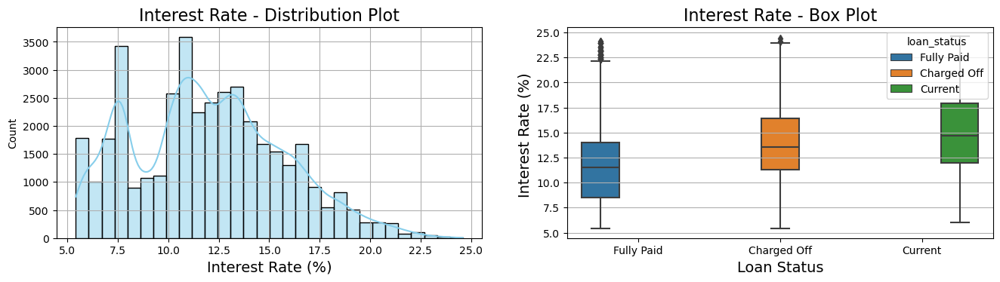

--------------------------------------------------------------------------------------
               count       mean       std   min    25%    50%      75%    max
loan_status                                                                  
Charged Off   5584.0  13.808626  3.648676  5.42  11.28  13.57  16.4000  24.40
Current       1126.0  15.000861  3.598350  6.00  11.99  14.65  17.8875  24.59
Fully Paid   32609.0  11.594074  3.591723  5.42   8.49  11.49  13.9800  24.11


In [50]:
# Bivariate analysis on loan status and "int_rate"
print(loan_data['int_rate'].describe())


# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='int_rate', kde=True, bins=30, color='skyblue')
ax.set_title('Interest Rate - Distribution Plot',fontsize=16)
ax.set_xlabel('Interest Rate (%)',fontsize=14)
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['int_rate'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('Interest Rate - Box Plot',fontsize=16)
ax.set_ylabel('Interest Rate (%) ',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')

plt.show()

print("--------------------------------------------------------------------------------------")
print(loan_data.groupby('loan_status')['int_rate'].describe())

### Observations:
### As loan rate increasing from 14.5 number of applications are decreasing. 
### Most of the borrowers intrest rates are between 9.25 to 14.59
### Fully paid cutoemrs intrest rates are low with compare to defaulters.
### If intrest rate is high then ther is probabilty to default loan 

count    39319.000000
mean       322.017733
std        206.206225
min         15.690000
25%        166.190000
50%        278.920000
75%        426.100000
max       1305.190000
Name: installment, dtype: float64


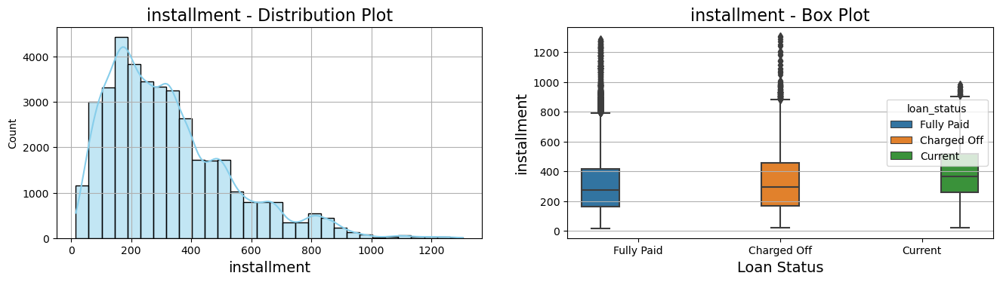

*********************************************************************
               count       mean       std   min    25%    50%      75%    max
loan_status                                                                  
Charged Off   5584.0  13.808626  3.648676  5.42  11.28  13.57  16.4000  24.40
Current       1126.0  15.000861  3.598350  6.00  11.99  14.65  17.8875  24.59
Fully Paid   32609.0  11.594074  3.591723  5.42   8.49  11.49  13.9800  24.11


In [51]:
# Bivariate analysis on loan status and "installment"
print(loan_data['installment'].describe())

# Specifying plot size
plt.figure(figsize=(16,8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.histplot(data=loan_data, x='installment', kde=True, bins=30, color='skyblue')
ax.set_title('installment - Distribution Plot',fontsize=16)
ax.set_xlabel('installment',fontsize=14)
ax.grid()

# subplot 2: Box Plot
plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['installment'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('installment - Box Plot',fontsize=16)
ax.set_ylabel('installment',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')

plt.show()

print("*********************************************************************")
print(loan_data.groupby('loan_status')['int_rate'].describe())

count     39319.000000
mean      65524.215697
std       35215.885257
min        4000.000000
25%       40000.000000
50%       58000.000000
75%       81000.000000
max      234996.000000
Name: annual_inc, dtype: float64


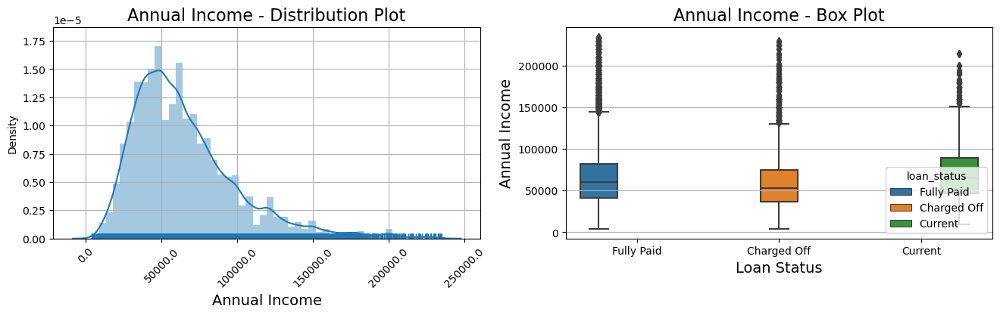

--------------------------------------------------------------------------------------
               count          mean           std     min      25%      50%  \
loan_status                                                                  
Charged Off   5584.0  59840.875716  32833.589429  4080.0  37000.0  52800.0   
Current       1126.0  72366.752220  36051.250690  9960.0  47000.0  64695.0   
Fully Paid   32609.0  66261.161765  35471.762375  4000.0  41000.0  60000.0   

                 75%       max  
loan_status                     
Charged Off  74879.0  230000.0  
Current      89000.0  215000.0  
Fully Paid   82404.0  234996.0  


In [52]:
# Bivariate analysis on loan status and 'Annual Income
print(loan_data['annual_inc'].describe())

# Specifying plot size
plt.figure(figsize=(16, 8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.distplot(loan_data['annual_inc'], rug=True)
ax.set_title('Annual Income - Distribution Plot', fontsize=16)
ax.set_xlabel('Annual Income', fontsize=14)
ax.set_xticklabels(ax.get_xticks(), rotation=45)  # Rotate x-axis labels for better readability
ax.grid()

# subplot 2: Box Plot

plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['annual_inc'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('Annual Income - Box Plot',fontsize=16)
ax.set_ylabel('Annual Income',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')


plt.show()
print("--------------------------------------------------------------------------------------")
print(loan_data.groupby('loan_status')['annual_inc'].describe())

### Observation 
### Most of the borrowers salary is 60000
### Fully paid borrowers salary is more whne compareted with charged off borrowers
### Less salary borrowers are becoming defaulters and avg salary of charged off boorowes is less than fully paid borrowers.


count    39319.000000
mean        13.376622
std          6.663140
min          0.000000
25%          8.270000
50%         13.480000
75%         18.640000
max         29.990000
Name: dti, dtype: float64


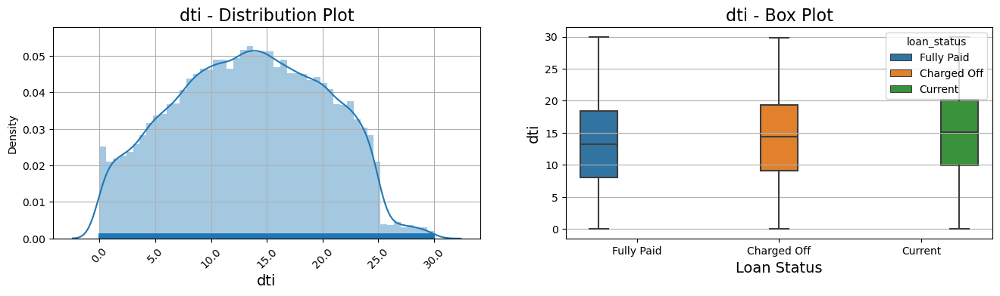

--------------------------------------------------------------------------------------
               count          mean           std     min      25%      50%  \
loan_status                                                                  
Charged Off   5584.0  59840.875716  32833.589429  4080.0  37000.0  52800.0   
Current       1126.0  72366.752220  36051.250690  9960.0  47000.0  64695.0   
Fully Paid   32609.0  66261.161765  35471.762375  4000.0  41000.0  60000.0   

                 75%       max  
loan_status                     
Charged Off  74879.0  230000.0  
Current      89000.0  215000.0  
Fully Paid   82404.0  234996.0  


In [53]:
# Bivariate analysis on loan status and dit

print(loan_data['dti'].describe())

# Specifying plot size
plt.figure(figsize=(16, 8))

# subplot 1: Distribution Plot
plt.subplot(2, 2, 1)
ax = sns.distplot(loan_data['dti'], rug=True)
ax.set_title('dti - Distribution Plot', fontsize=16)
ax.set_xlabel('dti', fontsize=14)
ax.set_xticklabels(ax.get_xticks(), rotation=45)  # Rotate x-axis labels for better readability
ax.grid()

# subplot 2: Box Plot

plt.subplot(2, 2, 2)
ax = sns.boxplot(y=loan_data['dti'], x=loan_data['loan_status'], hue=loan_data['loan_status'])
ax.set_title('dti - Box Plot',fontsize=16)
ax.set_ylabel('dti',fontsize=14)
ax.set_xlabel('Loan Status',fontsize=14)
ax.grid(axis='y')


plt.show()
print("--------------------------------------------------------------------------------------")
print(loan_data.groupby('loan_status')['annual_inc'].describe())

In [54]:
### Observations:Defaulted loan DTI is more when compared with fully paid loans.
### If the dti is more then there is chance to  defualte loan. 

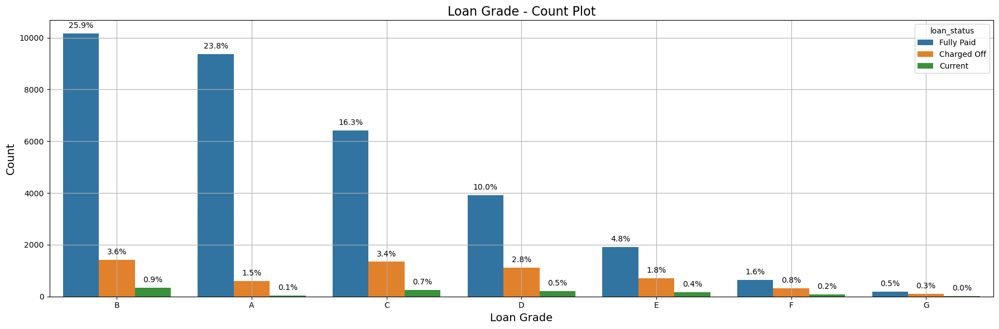

In [55]:
# Bivariate analysis on  "grade" and "loan status"


# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.grade, order=loan_data.grade.value_counts().index, hue=loan_data.loan_status)
bx1.set_title('Loan Grade - Count Plot', fontsize=16)
bx1.set_xlabel('Loan Grade', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.grade)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout() 
plt.show()

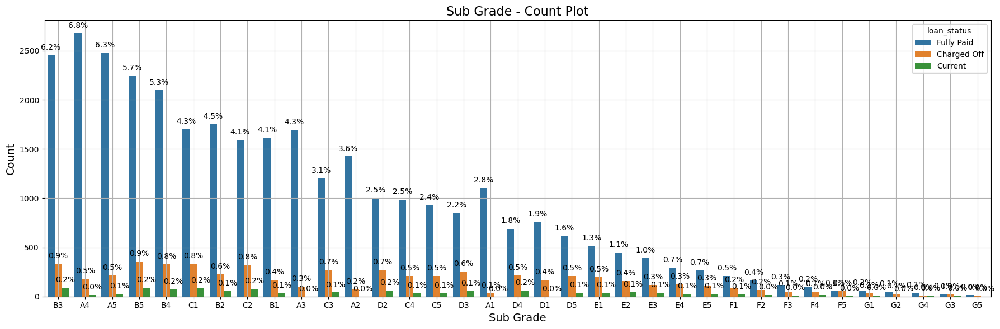

In [56]:
# Bivariate analysis on  "subgrade" and "loan status"


# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.sub_grade, order=loan_data.sub_grade.value_counts().index, hue=loan_data.loan_status)
bx1.set_title('Sub Grade - Count Plot', fontsize=16)
bx1.set_xlabel('Sub Grade', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.sub_grade)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout() 
plt.show()

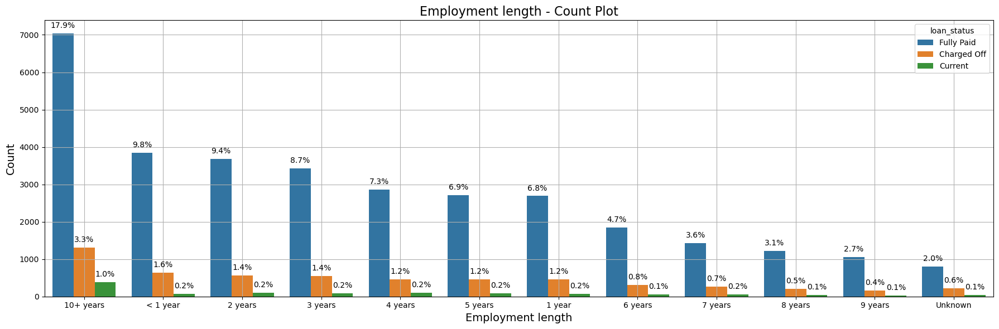

In [57]:
# Bivariate analysis on  "Employee length" and "loan status"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(18, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.emp_length, order=loan_data.emp_length.value_counts().index, hue=loan_data.loan_status)
bx1.set_title('Employment length - Count Plot', fontsize=16)
bx1.set_xlabel('Employment length', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.grid()

# Calculate percentages
total = len(loan_data.emp_length)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout() 
plt.show()

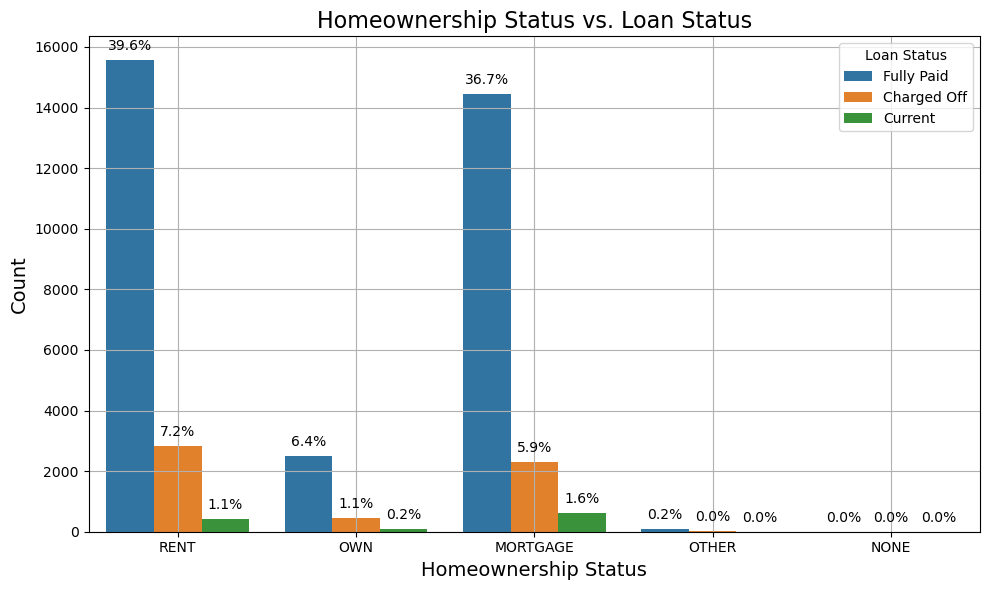

In [58]:
# Bivariate analysis on  "home_ownership" and "loan status"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Creating count plot
ax1 = sns.countplot(x='home_ownership', hue='loan_status', data=loan_data)
ax1.set_title('Homeownership Status vs. Loan Status', fontsize=16)
ax1.set_xlabel('Homeownership Status', fontsize=14)
ax1.set_ylabel('Count', fontsize=14)
ax1.grid(True)
ax1.legend(title='Loan Status')

# Calculate percentages
total = len(loan_data.loan_status)
for p in ax1.patches:
    height = p.get_height()
    ax1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.show()

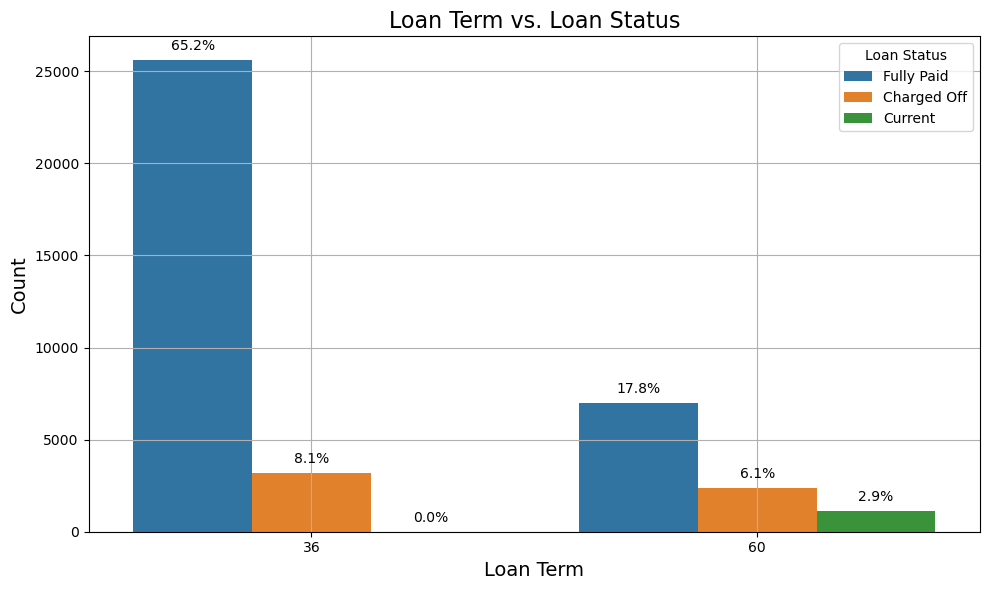

In [59]:
# Bivariate analysis on  "Term" and "loan status"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Creating count plot
ax1 = sns.countplot(x='term', hue='loan_status', data=loan_data)
ax1.set_title('Loan Term vs. Loan Status', fontsize=16)
ax1.set_xlabel('Loan Term', fontsize=14)
ax1.set_ylabel('Count', fontsize=14)
ax1.grid(True)
ax1.legend(title='Loan Status')

# Calculate percentages
total = len(loan_data.loan_status)
for p in ax1.patches:
    height = p.get_height()
    ax1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')

plt.tight_layout()
plt.show()

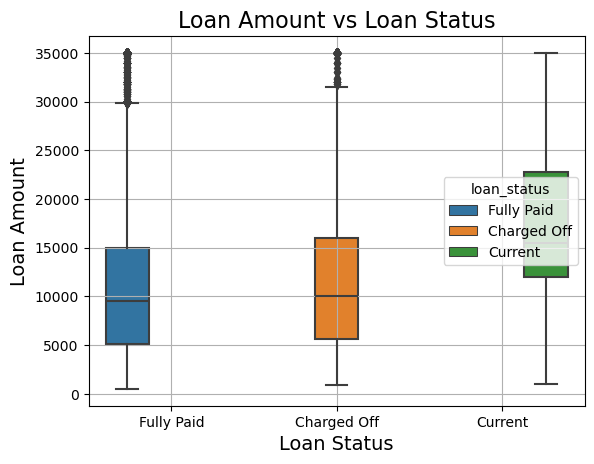

In [60]:
ax = sns.boxplot(x=loan_data.loan_status, y= loan_data.loan_amnt, hue=loan_data.loan_status)
ax.set_title("Loan Amount vs Loan Status", fontsize=16)
ax.set_ylabel("Loan Amount", fontsize=14)
ax.set_xlabel("Loan Status", fontsize=14)
ax.grid()

plt.show()

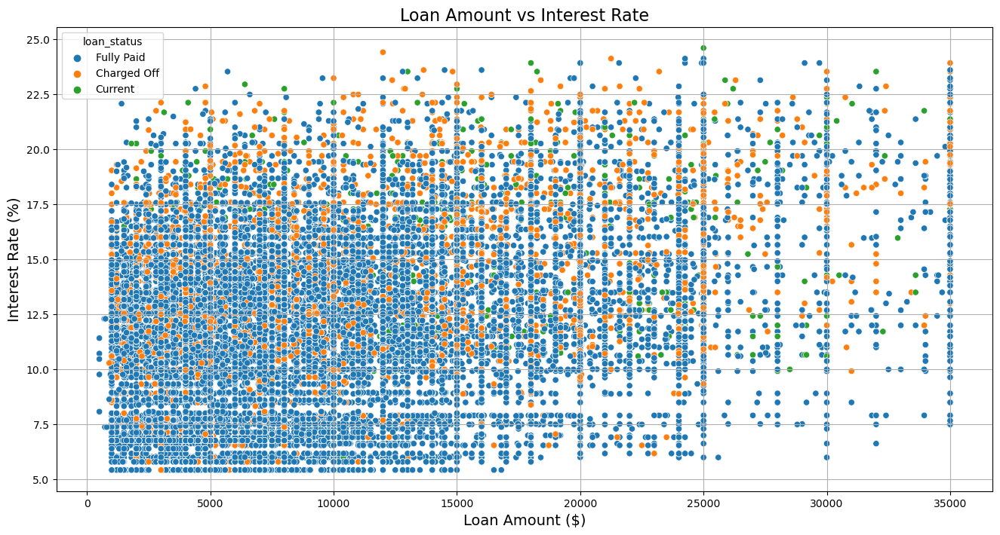

In [61]:
plt.figure(figsize=(16, 8))
bx1 = sns.scatterplot(x="loan_amnt", y='int_rate',hue="loan_status", data=loan_data)
bx1.set_title('Loan Amount vs Interest Rate', fontsize=16)
bx1.set_xlabel('Loan Amount ($)', fontsize=14)
bx1.set_ylabel('Interest Rate (%)', fontsize=14)
bx1.grid()

plt.savefig("int_rate_vs_loan_amt.png", transparent=True)
plt.show()

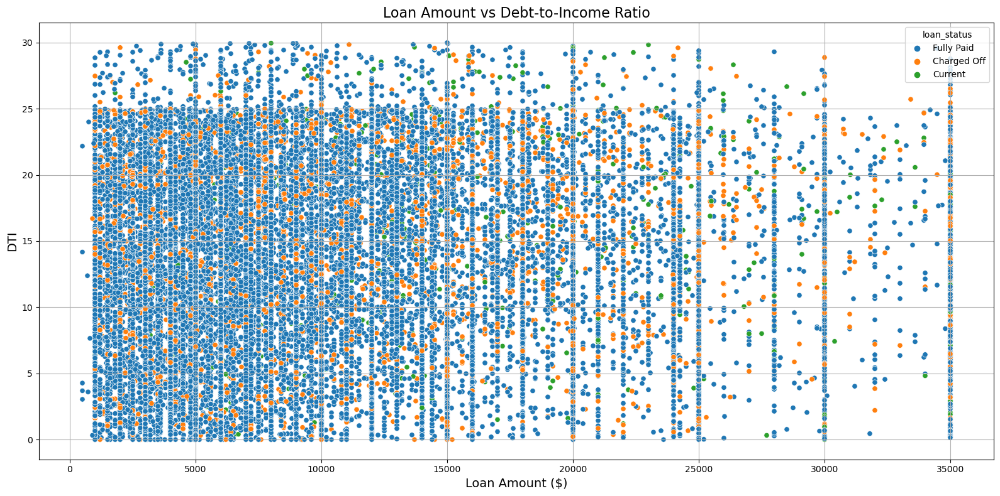

In [62]:
# Relation between Loan Amount and DTI

plt.figure(figsize=(16, 8))
bx1 = sns.scatterplot(x="loan_amnt", y='dti',hue="loan_status", data=loan_data)
bx1.set_title('Loan Amount vs Debt-to-Income Ratio', fontsize=16)
bx1.set_xlabel('Loan Amount ($)', fontsize=14)
bx1.set_ylabel('DTI', fontsize=14)
bx1.grid()

plt.tight_layout()
plt.savefig("dti.png", transparent=True)
plt.show()

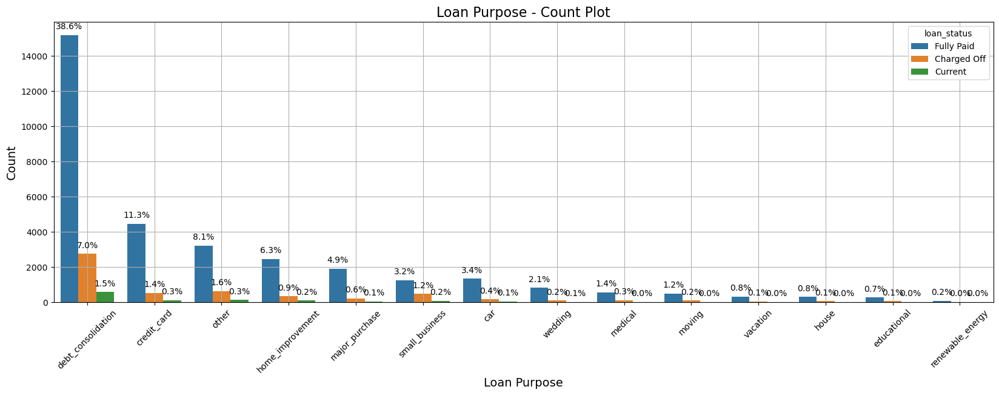

In [63]:
# Analysis of feature "purpose"

# Specifying plot size
fig, ax = plt.subplots(1, 1, figsize=(20, 6))

# Subplot 1: Count Plot with percentage
bx1 = sns.countplot(x=loan_data.purpose, order=loan_data.purpose.value_counts().index, hue=loan_data.loan_status)
bx1.set_title('Loan Purpose - Count Plot', fontsize=16)
bx1.set_xlabel('Loan Purpose', fontsize=14)
bx1.set_ylabel('Count', fontsize=14)
bx1.tick_params(axis='x', rotation=45)
bx1.grid()

# Calculate percentages
total = len(loan_data.purpose)
for p in bx1.patches:
    height = p.get_height()
    bx1.annotate('{:.1f}%'.format(100 * height / total), (p.get_x() + p.get_width() / 2., height),
                 ha='center', va='bottom', fontsize=10, color='black', xytext=(0, 5),
                 textcoords='offset points')


plt.show()

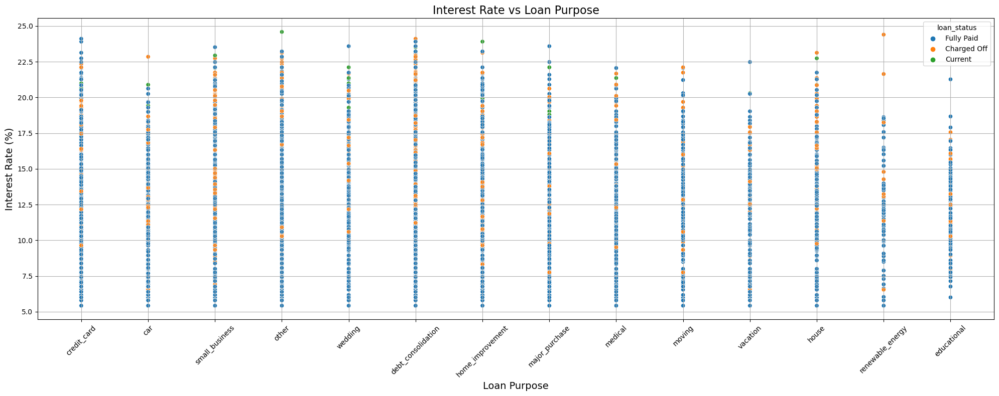

In [64]:
# Relation between Loan Interest Rate and Purpose

plt.figure(figsize=(20, 8))
bx1 = sns.scatterplot(x="purpose", y='int_rate',hue="loan_status", data=loan_data)
bx1.set_title('Interest Rate vs Loan Purpose', fontsize=16)
bx1.set_xlabel('Loan Purpose', fontsize=14)
bx1.set_ylabel('Interest Rate (%)', fontsize=14)
bx1.tick_params(axis='x', rotation=45)
bx1.grid()

plt.tight_layout()
plt.savefig("purpose_loan.png", transparent=True)
plt.show()

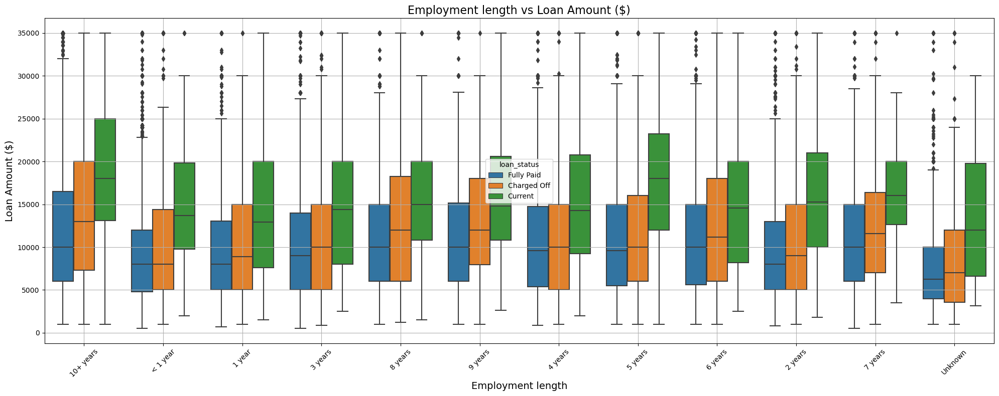

In [65]:
# Relation between Loan Amount and Employment length

plt.figure(figsize=(20, 8))
bx1 = sns.boxplot(x="emp_length", y='loan_amnt',hue="loan_status", data=loan_data)
bx1.set_title('Employment length vs Loan Amount ($)', fontsize=16)
bx1.set_xlabel('Employment length', fontsize=14)
bx1.set_ylabel('Loan Amount ($)', fontsize=14)
bx1.tick_params(axis='x', rotation=45)
bx1.grid()

plt.tight_layout()
plt.savefig("loanvsemployee.png", transparent=True)
plt.show()

#### Multivariate

In [66]:
loan_data.dtypes

id                        int64
loan_amnt                 int64
term                      int32
int_rate                float64
installment             float64
grade                    object
sub_grade                object
emp_length               object
home_ownership           object
annual_inc                int32
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
title                    object
addr_state               object
dti                     float64
delinq_2yrs               int64
earliest_cr_line         object
inq_last_6mths            int64
open_acc                  int64
pub_rec                   int64
revol_util              float64
total_acc                 int64
pub_rec_bankruptcies     object
dtype: object

In [67]:
loan_num_cols=['loan_amnt','int_rate','installment','annual_inc','dti','delinq_2yrs','inq_last_6mths','open_acc','pub_rec','revol_util','total_acc']
loan_data[loan_num_cols]

,loan_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,total_acc
0,5000,10.65,162.87,24000,27.65,0,1,3,0,83.7,9
1,2500,15.27,59.83,30000,1.00,0,5,3,0,9.4,4
2,2400,15.96,84.33,12252,8.72,0,2,2,0,98.5,10
3,10000,13.49,339.31,49200,20.00,0,1,10,0,21.0,37
4,3000,12.69,67.79,80000,17.94,0,0,15,0,53.9,38
...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,8.07,78.42,110000,11.33,0,0,13,0,13.1,40
39713,8500,10.28,275.38,18000,6.40,1,1,6,0,26.9,9
39714,5000,8.07,156.84,100000,2.30,0,0,11,0,19.4,20
39715,5000,7.43,155.38,200000,3.72,0,0,17,0,0.7,26


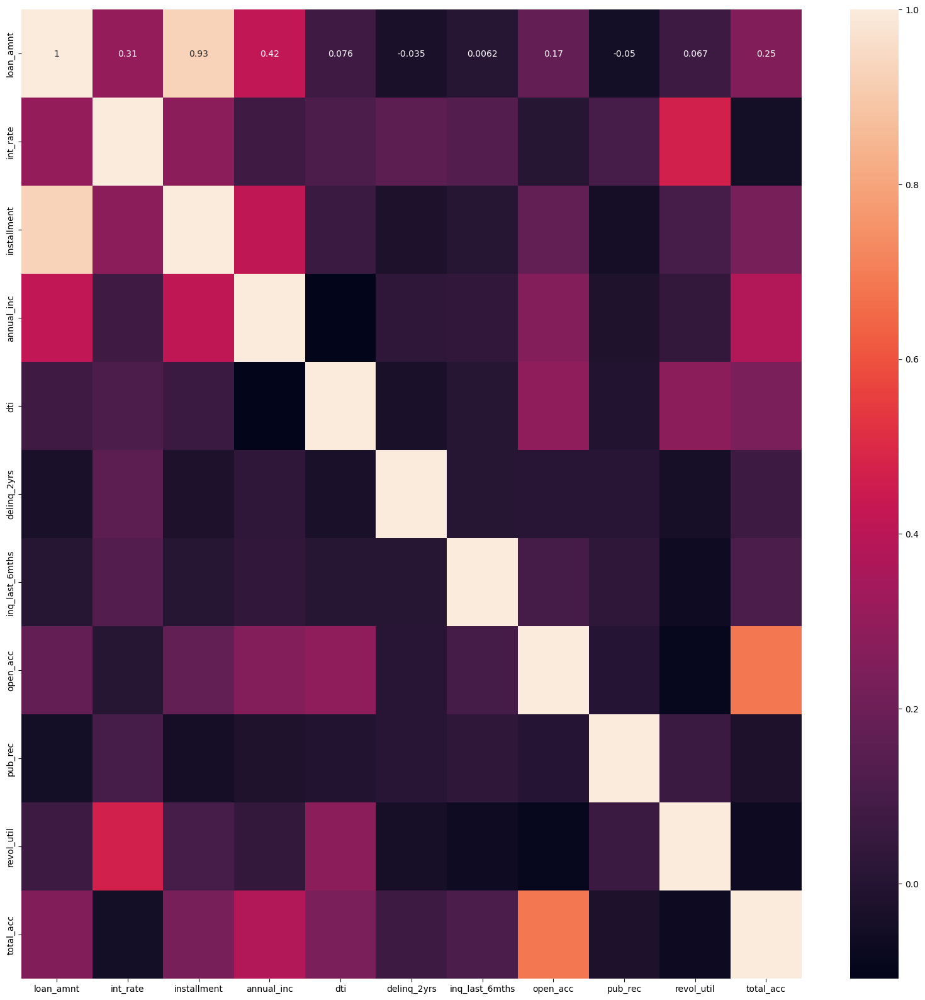

In [68]:
plt.figure(figsize=(20,20))
sns.heatmap(loan_data[loan_num_cols].corr(), annot=True)
plt.show()

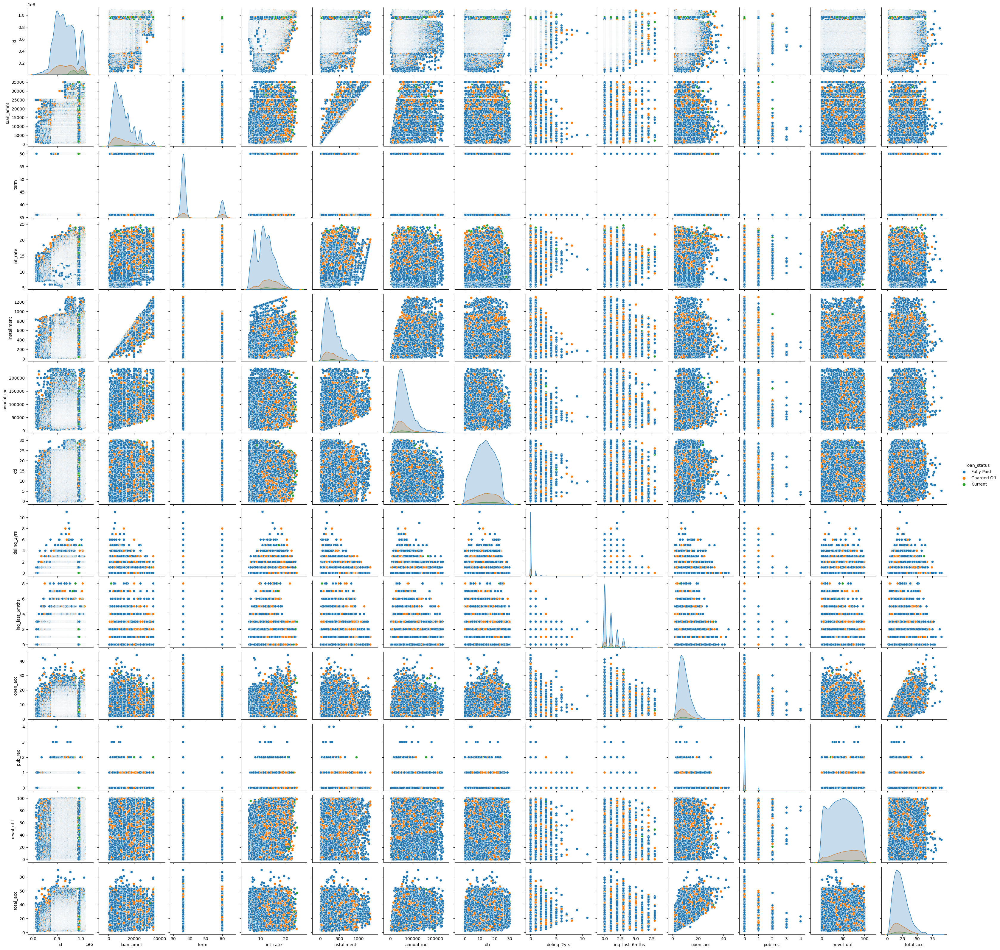

In [69]:
sns.pairplot(loan_data, hue="loan_status")

In [70]:
### Derived Metrics

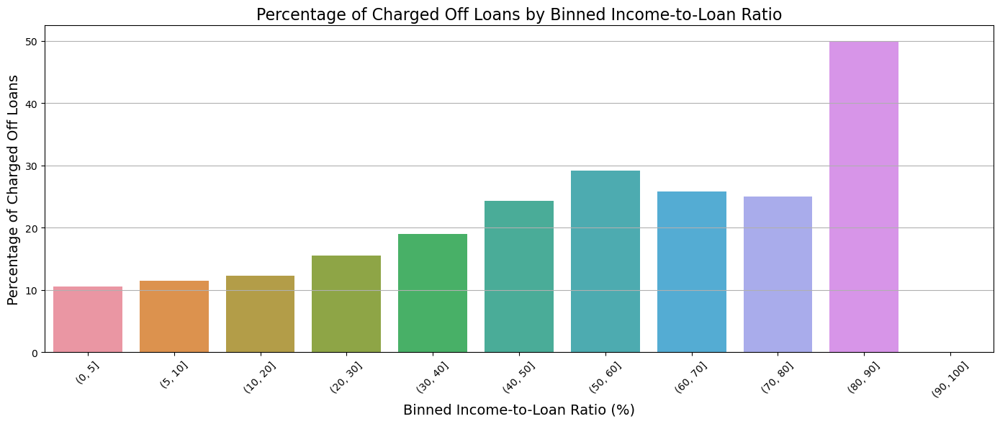

In [71]:
# Create a new column for the ratio of annual income to the loan amount
loan_data['income_loan_ratio'] = loan_data['loan_amnt'] * 100/ loan_data['annual_inc']

# Define custom bins for the ratio column (assuming ratio is in percentage)
bins = pd.cut(loan_data['income_loan_ratio'], bins=[0, 5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

# Calculate the percentage of charged-off loans and count of total loans within each bin
charged_off_counts = loan_data[loan_data['loan_status'] == 'Charged Off'].groupby(bins).size()
total_counts = loan_data.groupby(bins).size()
charged_off_percentage = (charged_off_counts / total_counts) * 100

# Plotting
plt.figure(figsize=(14, 6))

# Plot percentage of charged-off loans
ax = sns.barplot(x=charged_off_percentage.index, y=charged_off_percentage.values)

plt.title('Percentage of Charged Off Loans by Binned Income-to-Loan Ratio', fontsize=16)
plt.xlabel('Binned Income-to-Loan Ratio (%)', fontsize=14)
plt.ylabel('Percentage of Charged Off Loans', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.savefig("charged_off_percentage_with_count_on_top.png", transparent=True)
plt.show()